*Mario Esposito 17/06/2024*

# DeFungi: Image Classification w/ Transfer Learning (EfficientNetV2)

---

## Table of contents<a id='toc0_'></a>    
- [Introduction](#toc1_)    
    - [Five types of fungi](#toc1_1_1_)    
    - [Import libraries](#toc1_1_2_)    
    - [Define functions](#toc1_1_3_)    
    - [Metrics Computed per Individual Class:](#toc1_1_4_)    
    - [Macro-F1](#toc1_1_5_)    
    - [Download and split data](#toc1_1_6_)    
    - [Setup plotting parameters](#toc1_1_7_)    
    - [Setup data parameters](#toc1_1_8_)    
    - [ImageDataGenerator](#toc1_1_9_)    
    - [Class distribution (imbalanced)](#toc1_1_10_)    
    - [View some random selected images for each class](#toc1_1_11_)    
- [CNN](#toc2_)    
    - [Class weights](#toc2_1_1_)    
    - [EarlyStopping](#toc2_1_2_)    
    - [ReduceLROnPlateau](#toc2_1_3_)    
- [CNN(+ Dropout + Augmentation)](#toc3_)    
    - [Augmentation](#toc3_1_1_)    
    - [Visualize augmented images](#toc3_1_2_)    
    - [Dropout](#toc3_1_3_)    
- [Transfer learning](#toc4_)    
  - [EfficientNetV2B0 (6M)](#toc4_1_)    
    - [Feature extraction](#toc4_1_1_)    
    - [Fine-tuning *(unfreeze last layers weights)*](#toc4_1_2_)    
  - [EfficientNetV2S (20M)](#toc4_2_)    
    - [Feature extraction](#toc4_2_1_)    
    - [Fine-tuning *(unfreeze last layers weights)*](#toc4_2_2_)    
- [Evaluate the best model on Test set (Hold-out)](#toc5_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[Introduction](#toc0_)

***Task:*** Classification of Microscopic Fungi Images 

***Reference:*** [Sopo et al. 2021, DeFungi: Direct Mycological Examination of Microscopic Fungi Images](https://arxiv.org/abs/2109.07322)  

***Data Repository:*** [UCI ML (Donated on 1/28/2023)](https://archive.ics.uci.edu/dataset/773/defungi) 

***Description:***
The real-world data was provided by LEMM, including 3,025 unlabeled images of superficial fungal infections caused by dermatophyte fungi, moulds, or yeasts. All the raw images were sourced from a Sony’s DSC W830 compact camera. After collection, patching, filtering, and additional data preprocessing steps were executed to make the images fit for fungal infection detection. An automated procedure was developed using Python programming language to generate 500 × 500 pixels patches for each image. This was done to filter out the insignificant regions in the raw images that did not contain any fungi. Further, noise and unwanted artifacts were also removed via this method. The final number of relevant images was ***9114***, with 4404, 2334, 819, 818, and 739 images belonging to TSH, BASH, GMA, SHC, and BBH classes, respectively.

***Data format:*** Images (500x500, RGB)

***Split strategy:*** 
- **Training set-----> 75% (6834)**
- **Validation set---> 15% (1364)** (To optimize hyperparameters and to monitor loss for early stopping)
- **Test set---------> 10% (916)** (Hold-out for final evaluation)

***Running time:*** ~1h30m (Apple M1 Pro w/ Metal GPU acceleration)


### <a id='toc1_1_1_'></a>[Five types of fungi](#toc0_)

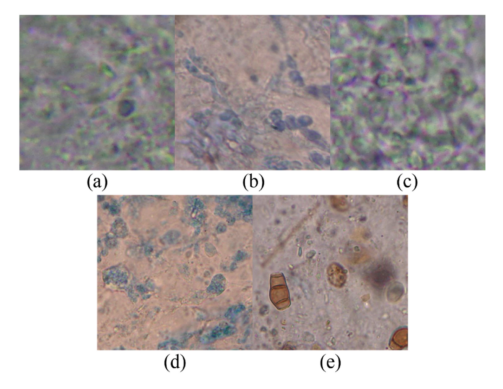

In [1]:
import matplotlib.pyplot as plt # 3.8.4
import matplotlib.image as mpimg
img = mpimg.imread('./samples.png')
plt.imshow(img)
plt.axis('off');

a.  **TSH**: Tortuous septate hyaline hyphae

b.  **BASH**: Beaded arthroconidial septate hyaline hyphae

c.  **GMA**: Groups or mosaics of arthroconidia

d.  **SHC**: Septate hyaline hyphae with chlamydioconidia

e.  **BBH**: Broad brown hyphae

<sup><sub>*[Credit](https://doi.org/10.1016/j.fraope.2023.100069)*</sup></sub>


### <a id='toc1_1_2_'></a>[Import libraries](#toc0_)

In [2]:
# python 3.10.14
import seaborn as sns # 0.13.2
import numpy as np  # 1.23.2
import pandas as pd # 2.2.2
import os
os.environ['TF_CPP_MIN_LOG_LEVEL']='2'  # silence tensorflow warnings
import tensorflow as tf        # 2.9.0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPooling2D, Dropout, Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback
from sklearn.utils.class_weight import compute_class_weight # 1.5.0
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter
# to make this notebook's output stable across runs (still not fully deterministic)
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

### <a id='toc1_1_3_'></a>[Define functions](#toc0_)

In [3]:
def plot_n_images_per_class(n, train_generator, class_dict, class_col_dict):
    """
    Plot n images per class with titles colored according to class_col_dict.
    
    Parameters:
        n (int): Number of images to plot per class.
        train_generator (DirectoryIterator): ImageDataGenerator.flow_from_directory generator.
        class_dict (dict): Dictionary mapping class indices to class names.
        class_col_dict (dict): Dictionary mapping class indices to class colors.
    """
    num_classes = len(class_dict)
    # Initialize lists to hold images and titles for each class
    images_per_class = {class_index: [] for class_index in class_dict.keys()}
    # Loop until we have enough images for each class
    while any(len(images) < n for images in images_per_class.values()):
        # Get a batch of images and labels from the generator
        images, labels = next(train_generator)
        for class_index in class_dict.keys():
            # Find the indices of images that belong to the current class
            class_images_indices = np.where(labels[:, class_index] == 1)[0]
            for img_index in class_images_indices:
                if len(images_per_class[class_index]) < n:
                    images_per_class[class_index].append(images[img_index])
                if all(len(images) >= n for images in images_per_class.values()):
                    break
    # Create a figure with appropriate size
    plt.figure(figsize=(num_classes * 2, n * 2))
    for class_index, class_name in class_dict.items():
        for i, img in enumerate(images_per_class[class_index]):
            plt.subplot(n, num_classes, i * num_classes + class_index + 1)
            plt.imshow(img)
            #plt.title(f'{class_name}', fontsize=12, color=class_col_dict[class_index])
            # Add colored rectangle behind the title
            if i==0:plt.text(0.5, 1.1, class_name, fontsize=12, color='white',ha='center', va='center', transform=plt.gca().transAxes,
                        bbox=dict(facecolor=class_col_dict[class_index], edgecolor='none', boxstyle='round,pad=0.3'))
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def plot_training_history(history, title, SET_COL_DICT):
    """
    Plot the training and validation metrics after training.
    
    Parameters:
        history: History object returned by the fit method of a Keras model.
        title (str): Title of the plot.
        SET_COL_DICT: Dictionary with colors for training and validation plots.
    """
    # Extract the metrics from the history object
    epochs = range(1, len(history.history['loss']) + 1)
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    lr = history.history['lr']
    #
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize=(6, 9))
    fig.suptitle(title, fontsize=20)
    # Plot loss
    ax1.plot(epochs, train_loss, linestyle='solid', color=SET_COL_DICT['training'], label="Train Loss")
    ax1.plot(epochs, val_loss, linestyle='solid', color=SET_COL_DICT['validation'], label="Val Loss")
    ax1.set_title(f'Loss')
    ax1.legend(loc='upper right')
    ax1.set_ylim(0, max(max(train_loss), max(val_loss)) * 1.1)
    ax1.grid(True)
    
    # Plot accuracy
    ax2.plot(epochs, train_acc, linestyle='solid', color=SET_COL_DICT['training'], label="Train Accuracy")
    ax2.plot(epochs, val_acc, linestyle='solid', color=SET_COL_DICT['validation'], label="Val Accuracy")
    ax2.set_title(f'Weighted Accuracy')
    ax2.set_ylim(0, 1)
    ax2.grid(True)
    
    # Plot learning rate
    ax3.plot(epochs, lr, linestyle='solid', color='grey', label="Learning Rate")
    ax3.set_title(f'Learning Rate')
    ax3.set_xlabel("Epochs")
    ax3.set_yscale('log')
    ax3.set_ylim(1e-9, max(lr) * 10)  
    ax3.grid(True)

    sns.despine(left=True)
    plt.tight_layout()
    plt.show()

def my_classification_report(y_true, y_pred, TITLE):
    """
    Generate a classification report including confusion matrix, normalized confusion matrix, and metrics.

    Parameters:
        y_true (array-like): True labels.
        y_pred (array-like): Predicted labels.
        TITLE (str): Title for the plot.

    Returns:
        plot
        pandas.DataFrame: Results of the classification report.
    """
    labels = list(CLASS_DICT.keys())
    class_names = list(CLASS_DICT.values())
    
    cm = pd.DataFrame(data=confusion_matrix(y_true, y_pred, labels=labels),
                        index=class_names, columns=[f'{name}' for name in class_names])
    cm_normalized = cm.divide(cm.sum(axis=1), axis=0)
    cm_df = pd.DataFrame(data=cm_normalized, index=class_names, columns=[f'{name}' for name in class_names])

    plt.figure(figsize=(14, 5))
    plt.suptitle(f'{TITLE}', fontsize=20, y=1.02)

    # Plot confusion matrix counts
    plt.subplot(1, 3, 1)
    plt.title('Counts', fontsize=16)
    sns.heatmap(cm, annot=True, fmt="d", square=1, linewidths=3, cmap='bone_r', cbar=0, annot_kws={"fontsize": 14})
    #plt.xticks(rotation=45)  
    plt.yticks(rotation=0)  
    plt.ylabel('True label')
    
    # Plot normalized confusion matrix
    plt.subplot(1, 3, 2)
    plt.title('Percentage by class', fontsize=16)
    sns.heatmap(cm_df, annot=True, fmt=".0%", square=1, linewidths=3, cmap='bone_r', annot_kws={"fontsize": 14}, cbar=0)
    #plt.xticks(rotation=45)  
    plt.yticks(rotation=0)  
    plt.ylabel('')
    plt.xlabel('')
    plt.yticks([])
    # Plot f1-score metrics
    METRICS_COL_DICT = {'f1-score': '#F86361', 'precision': '#E2E2E2', 'recall': '#CDCCCC'}
    results = classification_report(y_true=y_true, y_pred=y_pred, target_names=class_names, output_dict=True)
    macro_f1 = np.round(results['macro avg']['f1-score'], 3)
    results = pd.DataFrame(results).transpose().drop(['weighted avg', 'macro avg'], axis=0).drop('support', axis=1).drop('accuracy')
    df_melted = results.reset_index().melt(id_vars='index', var_name='Metric', value_name='Score')
    plt.subplot(1, 3, 3)
    plt.title(r"$\bf{" + 'Macro F1:'+ str(macro_f1) + "}$", fontsize=16)
    sns.barplot(data=df_melted, y='index', x='Score', hue='Metric', palette=METRICS_COL_DICT,
                width=0.75, gap=0, linewidth=0).set_xlim(0, 1)
    plt.ylabel('')
    plt.xlabel('')
    plt.yticks([])
    sns.despine(left=0, top=1, right=0)
    plt.legend(title='Metric', loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

    return results


### <a id='toc1_1_4_'></a>[Metrics Computed per Individual Class:](#toc0_)


- **Precision and recall**

  $$ Precision = \frac{TP}{TP + FP} $$

  $$ Recall = \frac{TP}{TP + FN} $$

- **F1-score:** The F1-score is the harmonic mean of precision and recall, providing a balance between the two metrics. 

  $$ F1 = 2 \times \frac{precision \times recall}{precision + recall} $$

### <a id='toc1_1_5_'></a>[Macro-F1](#toc0_)

- **Macro-F1** calculates the F1-score for each class individually and then takes the unweighted average of these scores. Macro-averaging is useful when all classes are equally important, also, when for imbalanced datasets to ensure that each class equally contributes to the final evaluation indipendently of their distributions.


### <a id='toc1_1_6_'></a>[Download and split data](#toc0_)

In [4]:
#! wget --content-disposition --content-disposition "https://archive.ics.uci.edu/static/public/773/defungi.zip"
#! unzip defungi.zip -d ./data
#! pip install split-folders
#import splitfolders
#splitfolders.ratio("./data", output="./partitions",
#seed=SEED, ratio=(0.75, 0.15, 0.1), group_prefix=None, move=False)

### <a id='toc1_1_7_'></a>[Setup plotting parameters](#toc0_)

In [5]:
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18
#
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

# Define the colors for the plots
BACKGROUND_COL = '#F2F2F2'
AXIS_COLOR     = '#BEBEBE' 
LINES_COLOR    = '#BEBEBE'
sns.set_style("whitegrid", {'grid.linestyle': '--',
                            'grid.color': LINES_COLOR,
                            'axes.edgecolor': AXIS_COLOR,
                            'axes.facecolor':BACKGROUND_COL,
                            'figure.facecolor':BACKGROUND_COL,
                            })
plt.rcParams['axes.facecolor'] = BACKGROUND_COL

# dictionary to map the class number to the class name
CLASS_DICT = {0: 'TSH', 1: 'BASH', 2: 'GMA', 3: 'SHC', 4: 'BBH'}

# Define the class color dictionary
CLASS_COL_DICT = {
    0: '#C65742', 
    1:   '#E4BF44',
    2:   '#ABA18D',
    3:   '#9AD0BB', 
    4:  '#332737', 
}

# Define the dataset color dictionary
SET_COL_DICT= {'validation':'#f28482','training':'#84a59d'}

# Create the legend
CLASS_LEGEND = [
    plt.Line2D([0], [0], marker='o', color='#F3F0E7', label=CLASS_DICT[ct], markerfacecolor=color, markersize=10)
    for ct, color in CLASS_COL_DICT.items()]

%matplotlib inline
%config InlineBackend.figure_format='retina' 

### <a id='toc1_1_8_'></a>[Setup data parameters](#toc0_)

In [6]:
# Define the paths to the data partitions
TRAIN_PATH = './partitions/train'
VAL_PATH = './partitions/val'
TEST_PATH = './partitions/test'

#
BATCH_SIZE = 32
HEIGHT = 224
WIDTH = 224
DIM = (HEIGHT,WIDTH)

### <a id='toc1_1_9_'></a>[ImageDataGenerator](#toc0_)

In [7]:
# Create the data generators
data_gen = ImageDataGenerator(rescale = 1./255) # rescale the pixel values to [0,1]

train = data_gen.flow_from_directory(       
        TRAIN_PATH,
        target_size=DIM,
        color_mode='rgb',
        class_mode='categorical', 
        shuffle=True,              
        seed=SEED,
        batch_size=BATCH_SIZE,
        )
val = data_gen.flow_from_directory(
        VAL_PATH,
        target_size=DIM,
        color_mode='rgb',
        shuffle=False,
        class_mode='categorical',
        batch_size=BATCH_SIZE
        )
test = data_gen.flow_from_directory(
        TEST_PATH,
        target_size=DIM,
        color_mode='rgb',
        shuffle=False,
        class_mode='categorical',
        batch_size=BATCH_SIZE
        )

Found 6834 images belonging to 5 classes.
Found 1364 images belonging to 5 classes.
Found 916 images belonging to 5 classes.


### <a id='toc1_1_10_'></a>[Class distribution (imbalanced)](#toc0_)

In [8]:
# Summing up the counts of images in each class from the respective generators
train_class_counts = train.classes
val_class_counts = val.classes
test_class_counts = test.classes
# Combine all class counts
all_class_counts = np.concatenate([train_class_counts, val_class_counts, test_class_counts])
# Count the number of images in each class
class_counts = Counter(all_class_counts)
# Print the counts for each class
for class_index, class_name in CLASS_DICT.items():
    print(f"{class_name}: {class_counts[class_index]} images")

TSH: 4404 images
BASH: 2334 images
GMA: 819 images
SHC: 818 images
BBH: 739 images


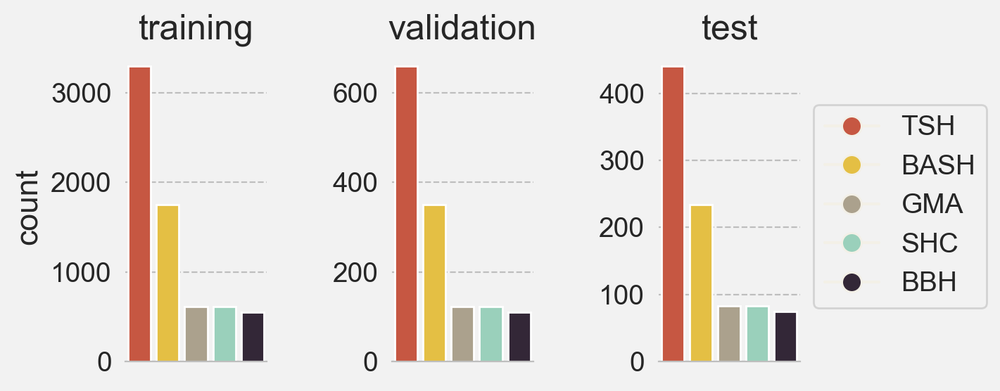

In [9]:
plt.figure(figsize=(6,3))
for i,name,dataset in ((0,'training',train),(1,'validation',val),(2,'test',test)):
    plt.subplot(1,3,i+1)
    plt.title(name)
    sns.countplot(x=dataset.classes,hue=dataset.classes,legend=0,palette=CLASS_COL_DICT, saturation=1)
    plt.xlabel('')
    plt.xticks([])
    plt.tight_layout()
    sns.despine(left=1)
    if i >0: plt.ylabel('')
plt.legend(handles=CLASS_LEGEND, loc='center left', bbox_to_anchor=(1, 0.5));

### <a id='toc1_1_11_'></a>[View some random selected images for each class](#toc0_)

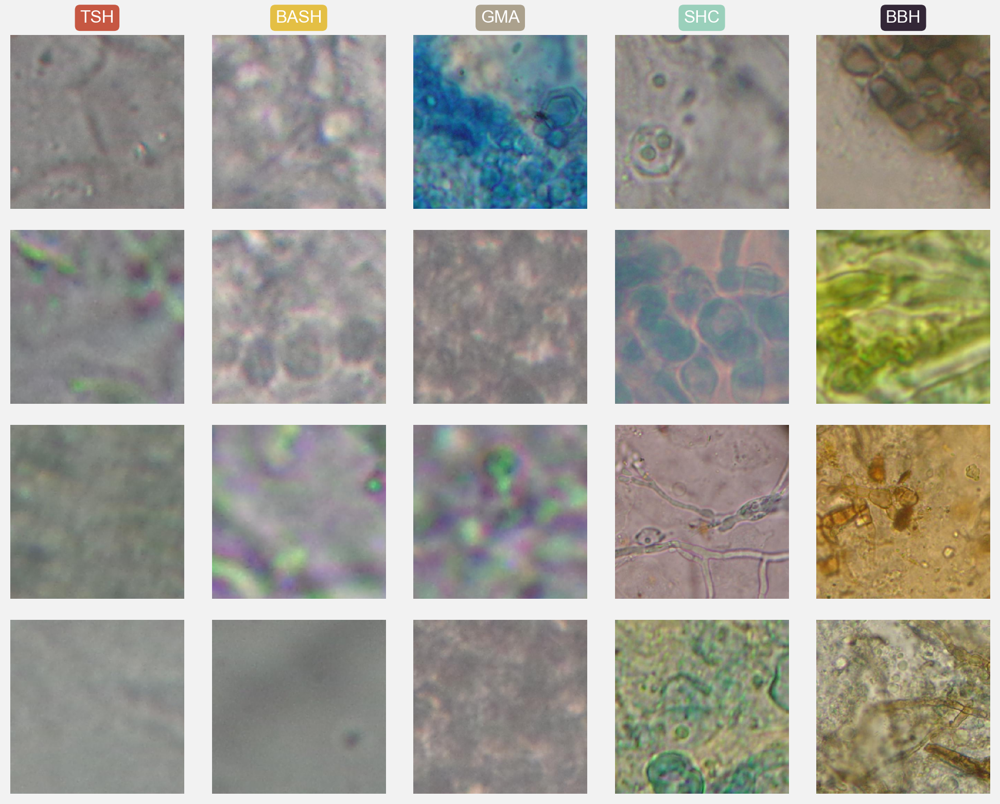

In [10]:
plot_n_images_per_class(4, train, CLASS_DICT, CLASS_COL_DICT)

# <a id='toc2_'></a>[CNN](#toc0_)

Let's try to classify images with a base CNN

In [11]:
# Initialize the CNN
CNN = Sequential(name='CNN')
# Add the first convolutional layer
CNN.add(Conv2D(32, (3, 3), activation="relu", padding='same',
                input_shape=(WIDTH, HEIGHT, 3),                              name='Conv_1' ))
# Add the first pooling layer
CNN.add(MaxPooling2D(pool_size = (2, 2),                                     name=f'MaxPool_1'))
# Add other 3 blocks of convolutional and pooling layers
for i in range(2,5):
    num_filters= 32 * (2**(i-1))  # double the number of filters at each block
    CNN.add(Conv2D(num_filters, (3, 3), activation="relu", padding='same',   name=f'Conv_{i}' ))
    CNN.add(MaxPooling2D(pool_size = (2, 2),                                 name=f'MaxPool_{i}'))
# Add the flattening layer and the output layer
CNN.add(Flatten(name='Flatten'))
CNN.add(Dense(activation = 'softmax', units = 5,                             name='Output'))
# Compile the CNN with the Adam optimizer and categorical crossentropy loss
CNN.compile(optimizer = 'adam', 
            loss = 'categorical_crossentropy', 
            weighted_metrics = ['accuracy'])    # weighted accuracy to account for class imbalance
CNN.summary()

Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB

Model: "CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv_1 (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 MaxPool_1 (MaxPooling2D)    (None, 112, 112, 32)      0         
                                                                 
 Conv_2 (Conv2D)             (None, 112, 112, 64)      18496     
                                                                 
 MaxPool_2 (MaxPooling2D)    (None, 56, 56, 64)        0         
                                                                 
 Conv_3 (Conv2D)             (None, 56, 56, 128)       73856     
                                                                 
 MaxPool_3 (MaxPooling2D)    (None, 28, 28, 128)       0         
                                                

### <a id='toc2_1_1_'></a>[Class weights](#toc0_)
Class weights are used to handle imbalanced datasets in classification problems. When some classes are underrepresented compared to others, the model might become biased towards the majority classes. To mitigate this, class weights assign different importance to each class by adopting the weighted categorical crossentropy loss function.

$$
\text{Weighted Categorical Crossentropy Loss} = -\sum_{c=1}^{C} w_c \cdot y_c \cdot \log(\hat{y}_c)
$$


$$
w_c = \text{The weight associated with class } c
$$

$$
y_c = \text{The true probability of class } c
$$

$$
\hat{y}_c = \text{The predicted probability of class } c
$$




In [12]:
WEIGHTS = compute_class_weight('balanced',classes= np.array([0,1,2,3,4]), y=train.classes)
cw = dict(zip([0,1,2,3,4], WEIGHTS))
print(cw)

{0: 0.41380563124432335, 1: 0.7810285714285714, 2: 2.2260586319218243, 3: 2.229690048939641, 4: 2.467148014440433}


### <a id='toc2_1_2_'></a>[EarlyStopping](#toc0_)
EarlyStopping is a callback function in Keras that monitors a specified metric during training and stops training early if the metric stops improving, thereby preventing overfitting and saving computational resources. 

<sup><sub>*"restore_best_weights=True"* will restore the weights of the model with lowest val loss (set an unreasonable number of epochs to trigger early stopping and restore best weights)</sup></sub>



In [13]:
early_stop = EarlyStopping(
    monitor='val_loss',              # Monitor the validation loss during training.
    mode='min',                      # Objective is to minimize the monitored quantity.
    patience=7,                      # Number of epochs with no improvement after which training will be stopped.
    verbose=1,                       
    restore_best_weights=True        # Restore model weights from the epoch with the best value of val loss.
)

### <a id='toc2_1_3_'></a>[ReduceLROnPlateau](#toc0_)

ReduceLROnPlateau is a callback function in Keras that dynamically adjusts the learning rate during training if a monitored metric such as validation loss stops improving, aiming to enhance model convergence and performance.

In [14]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',    # Monitor the validation loss during training.
    mode='min',                      # Objective is to minimize the monitored quantity.
    patience=3,            # Number of epochs with no improvement after which learning rate will be reduced.
    verbose=1,             
    factor=0.2,            # Factor by which the learning rate will be reduced. new_lr = lr * factor.
    min_lr=1e-9            # Minimum learning rate below which it will not be reduced.
)
my_callbacks = [early_stop, reduce_lr ]

Epoch 1/500
214/214 [==============================] - 21s 97ms/step - loss: 1.2975 - accuracy: 0.4433 - val_loss: 1.1884 - val_accuracy: 0.5315 - lr: 0.0010
Epoch 2/500
214/214 [==============================] - 20s 93ms/step - loss: 1.1517 - accuracy: 0.5305 - val_loss: 1.4270 - val_accuracy: 0.4311 - lr: 0.0010
Epoch 3/500
214/214 [==============================] - 20s 94ms/step - loss: 1.1341 - accuracy: 0.5450 - val_loss: 1.0882 - val_accuracy: 0.5777 - lr: 0.0010
Epoch 4/500
214/214 [==============================] - 20s 94ms/step - loss: 1.0941 - accuracy: 0.5554 - val_loss: 1.0130 - val_accuracy: 0.5975 - lr: 0.0010
Epoch 5/500
214/214 [==============================] - 20s 93ms/step - loss: 1.0515 - accuracy: 0.5711 - val_loss: 1.0973 - val_accuracy: 0.5484 - lr: 0.0010
Epoch 6/500
214/214 [==============================] - 20s 94ms/step - loss: 1.0162 - accuracy: 0.5973 - val_loss: 0.9950 - val_accuracy: 0.6158 - lr: 0.0010
Epoch 7/500
214/214 [==============================]

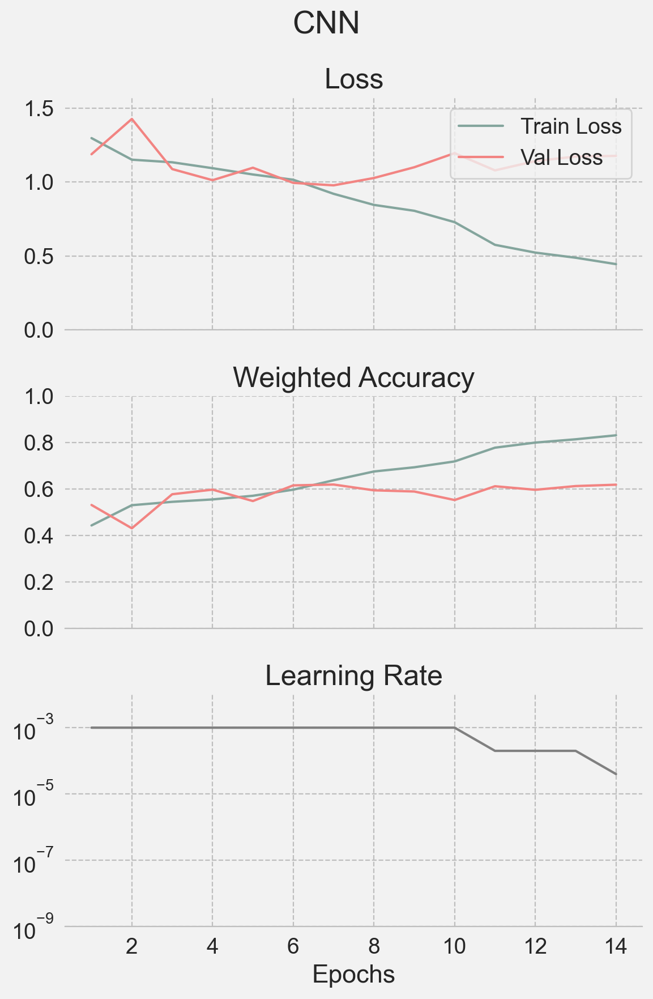

CPU times: user 2min 17s, sys: 52.9 s, total: 3min 10s
Wall time: 4min 41s


In [15]:
%%time
np.random.seed(SEED)
tf.random.set_seed(SEED)

history = CNN.fit(train, 
                    epochs=500,  # set an unreasonable number of epochs to trigger early stopping and restore best weights
                    validation_data=val, 
                    callbacks=my_callbacks, 
                    class_weight=cw,)  

plot_training_history(history, title="CNN",SET_COL_DICT=SET_COL_DICT)

43/43 [==============================] - 1s 28ms/step


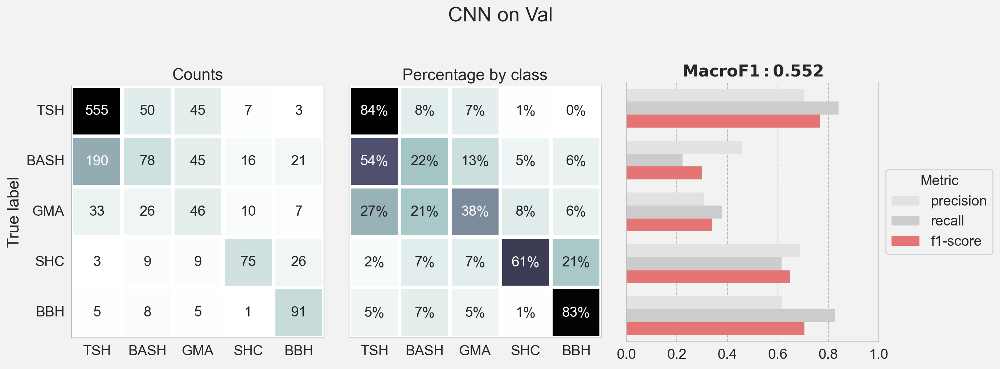

,precision,recall,f1-score
TSH,0.706107,0.840909,0.767635
BASH,0.456140,0.222857,0.299424
GMA,0.306667,0.377049,0.338235
SHC,0.688073,0.614754,0.649351
BBH,0.614865,0.827273,0.705426


In [16]:
TITLE = 'CNN on Val'
model = CNN
data = val
y_preds = np.argmax(model.predict(data), axis=-1)
my_classification_report(data.classes, y_preds, TITLE)

***Comments***

---
- *Around epoch 6 the val. loss stop to improve while the training loss continue to do it (overfitting)*
- *Overall the classification performance are poor (Macro-F1: 0.552)*
- *When evaluating the model's performance **individually** for each class, it is clear that it performs very heterogeneously w/ a lower F1 score for BASH and TSH classes and a better F1-score for the other 3 classes.*

---

# <a id='toc3_'></a>[CNN(+ Dropout + Augmentation)](#toc0_)

### <a id='toc3_1_1_'></a>[Augmentation](#toc0_)
Augmentation refers to the process of artificially increasing the size and diversity of a training dataset by applying various transformations (e.g., rotations, flips, shifts) to the existing data.

***Aim:*** To enhance the robustness and generalization ability of CNNs by providing more varied training examples.

***Key points of ImageDataGenerator (compared to saving augmented images on disk):***

- On-the-fly: Performs data augmentation in real-time during training. Images are augmented in memory and fed directly to the model.
- No Disk Space Usage: Since images are augmented in memory, there is no additional disk space required for storing augmented images.
- Flexibility: Allows dynamic and varied augmentations for each epoch, potentially providing a more diverse set of training examples.

In [17]:
aug_gen = ImageDataGenerator(
    rescale=1./255,             # Rescale pixel values to the range [0, 1] (originally [0, 255]).
    rotation_range=10,          # Randomly rotate images in the range -10 to 10 degrees.
    shear_range=0.2,            # Apply random shear transformations.
    horizontal_flip=True,       # Randomly flip images horizontally.
    vertical_flip=True,         # Randomly flip images vertically.
)

train_aug = aug_gen.flow_from_directory(  # Notice that images are augmented ONLY in the TRAINING set
        TRAIN_PATH,
        target_size=DIM,
        color_mode='rgb',
        class_mode='categorical',
        shuffle=True,
        seed=SEED,
        batch_size=BATCH_SIZE,
        )

Found 6834 images belonging to 5 classes.


### <a id='toc3_1_2_'></a>[Visualize augmented images](#toc0_)

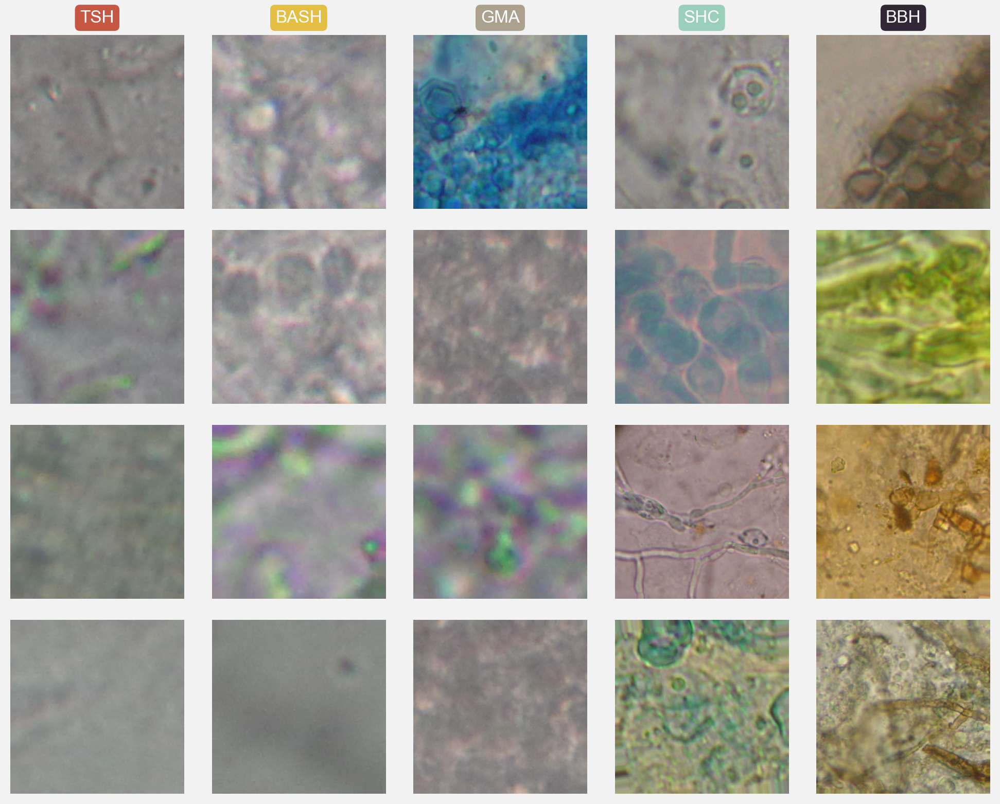

In [18]:
plot_n_images_per_class(4, train_aug, CLASS_DICT, CLASS_COL_DICT)

### <a id='toc3_1_3_'></a>[Dropout](#toc0_)
The term “dropout” refers to dropping out the nodes of a layer in a neural network. All the forward and backwards connections with a dropped node are temporarily removed, thus creating a new network architecture out of the parent network. The nodes are dropped by a dropout probability of p.

***Usefulness:*** Dropout helps prevent overfitting by ensuring that the model does not rely too heavily on any single neuron, promoting the learning of more robust and generalized features.

In [19]:
CNN2 = Sequential(name='CNN2')
CNN2.add(Conv2D(32, (3, 3), activation="relu", padding='same',
                input_shape=(WIDTH, HEIGHT, 3),                     name='Conv_1' ))
CNN2.add(MaxPooling2D(pool_size = (2, 2),                           name=f'MaxPool_1'))
for i in range(2,5):
    num_filters= 32 * (2**(i-1))  
    CNN2.add(Conv2D(num_filters, (3, 3), activation="relu", padding='same',   name=f'Conv_{i}' ))
    CNN2.add(MaxPooling2D(pool_size = (2, 2),                       name=f'MaxPool_{i}'))
CNN2.add(Flatten(name='Flatten'))
# Add a dropout layer before the output layer
CNN2.add(Dropout(0.4, seed=SEED,                                    name='Dropout_Output')) #
CNN2.add(Dense(activation = 'softmax', units = 5,                   name='Output'))

CNN2.compile(optimizer = 'adam', loss = 'categorical_crossentropy', weighted_metrics = ['accuracy'])
CNN2.summary()

Model: "CNN2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv_1 (Conv2D)             (None, 224, 224, 32)      896       
                                                                 
 MaxPool_1 (MaxPooling2D)    (None, 112, 112, 32)      0         
                                                                 
 Conv_2 (Conv2D)             (None, 112, 112, 64)      18496     
                                                                 
 MaxPool_2 (MaxPooling2D)    (None, 56, 56, 64)        0         
                                                                 
 Conv_3 (Conv2D)             (None, 56, 56, 128)       73856     
                                                                 
 MaxPool_3 (MaxPooling2D)    (None, 28, 28, 128)       0         
                                                                 
 Conv_4 (Conv2D)             (None, 28, 28, 256)       295168 

Epoch 1/500
214/214 [==============================] - 36s 167ms/step - loss: 1.3271 - accuracy: 0.4431 - val_loss: 1.1113 - val_accuracy: 0.5601 - lr: 0.0010
Epoch 2/500
214/214 [==============================] - 35s 165ms/step - loss: 1.1452 - accuracy: 0.5345 - val_loss: 1.1276 - val_accuracy: 0.5674 - lr: 0.0010
Epoch 3/500
214/214 [==============================] - 35s 161ms/step - loss: 1.0989 - accuracy: 0.5608 - val_loss: 1.0453 - val_accuracy: 0.5931 - lr: 0.0010
Epoch 4/500
214/214 [==============================] - 35s 161ms/step - loss: 1.0924 - accuracy: 0.5532 - val_loss: 1.0937 - val_accuracy: 0.5704 - lr: 0.0010
Epoch 5/500
214/214 [==============================] - 35s 162ms/step - loss: 1.1110 - accuracy: 0.5458 - val_loss: 1.2152 - val_accuracy: 0.5044 - lr: 0.0010
Epoch 6/500
214/214 [==============================] - 35s 163ms/step - loss: 1.0864 - accuracy: 0.5603 - val_loss: 1.0185 - val_accuracy: 0.6144 - lr: 0.0010
Epoch 7/500
214/214 [=========================

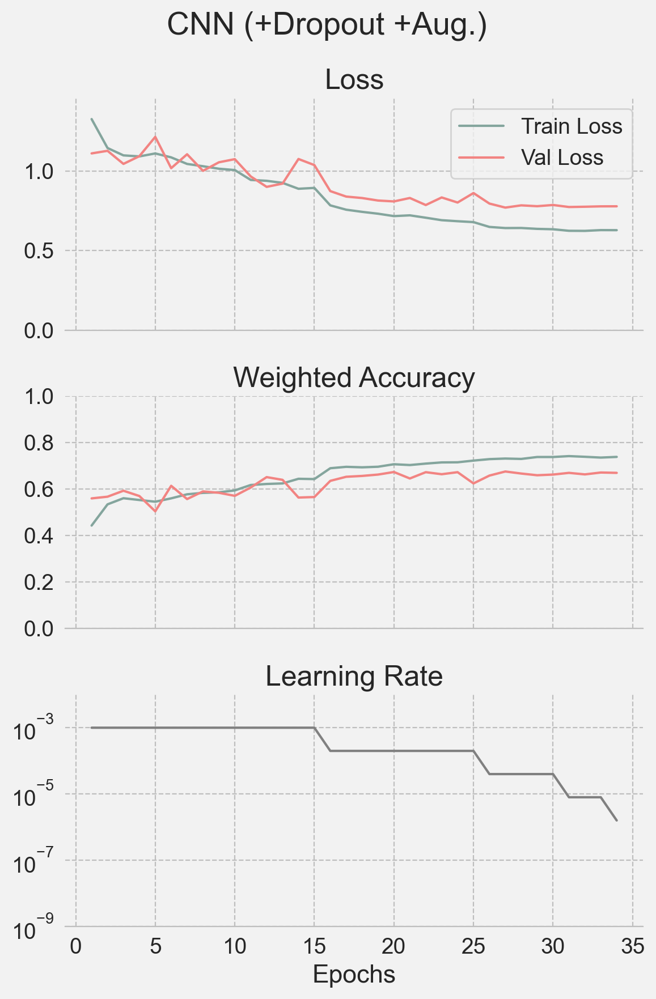

CPU times: user 20min 29s, sys: 2min 17s, total: 22min 46s
Wall time: 19min 49s


In [20]:
%%time
np.random.seed(SEED)
tf.random.set_seed(SEED)

history = CNN2.fit(train_aug,  # <-- Use the augmented training set
                    epochs=500, 
                    validation_data=val, 
                    callbacks=my_callbacks, 
                    class_weight=cw,)

plot_training_history(history, title="CNN (+Dropout +Aug.)",SET_COL_DICT=SET_COL_DICT)


43/43 [==============================] - 1s 27ms/step


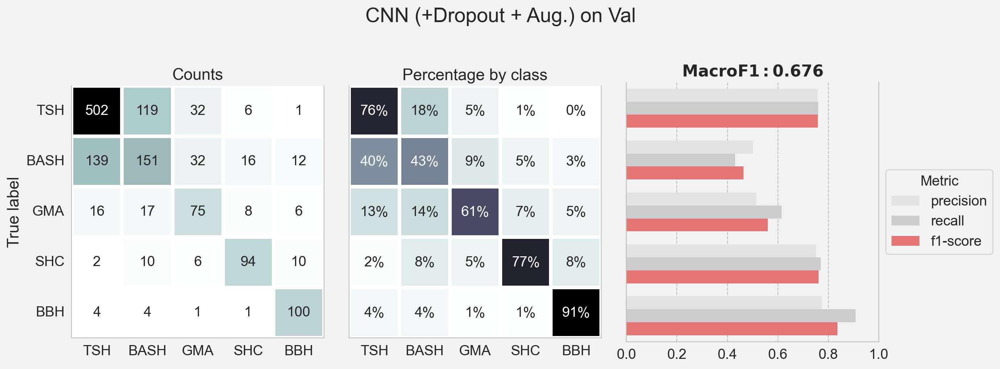

,precision,recall,f1-score
TSH,0.757164,0.760606,0.758881
BASH,0.501661,0.431429,0.463902
GMA,0.513699,0.614754,0.559701
SHC,0.752000,0.770492,0.761134
BBH,0.775194,0.909091,0.836820


In [21]:
TITLE = 'CNN (+Dropout + Aug.) on Val'
model = CNN2
data = val
y_preds = np.argmax(model.predict(data), axis=-1)
my_classification_report(data.classes, y_preds, TITLE)

***Comments***

---
- *Until epoch ~25 both training and validation losses follow a decreasing trend, demonstrating the action of data Aug. and Dropout*
- *Overall the classification performance are improved w/ Macro-F1: 0.676 (0.552 before)*
- *Despite the individual model's performances for each class are still heterogeneous, they are improved more-or-less for all classes*
- *It seems that the addition of data Augmentation and Dropout helps to tackle overfitting*
- *By the way, there is still **room for improvment***

---

# <a id='toc4_'></a>[Transfer learning](#toc0_)

Transfer learning is a machine learning technique where a pre-trained model is used as the starting point for a different but related task. Instead of training a model from scratch, you leverage a model that has been trained on a large dataset and apply it to your specific problem. This is especially useful when you have a limited amount of data for the new task.


Take in mind that different strategies can be adopted.

**My approach:** apply in sequence, Feature Extraction and Fine-Tuning.

1. ***Feature Extraction:*** Using the pre-trained model to extract features from the dataset while keeping the model's weights frozen. Use these extracted features as input to a new top classifier (in my case a simple softmax layer) that you train on your specific dataset.

2. ***Fine-Tuning:*** Unfreezing some layers of the pre-trained model to further train the model on the specific dataset, allowing it to learn more task-specific features.  Usually later layers are unfrozen because they learn more complex/specific features.


<sup><sub>*[From Tensorflow](https://www.tensorflow.org/tutorials/images/transfer_learning#fine_tuning):  This should only be attempted after you have trained the top-level classifier with the pre-trained model set to non-trainable. If you add a randomly initialized classifier on top of a pre-trained model and attempt to train all layers jointly, the magnitude of the gradient updates will be too large (due to the random weights from the classifier) and your pre-trained model will forget what it has learned.*</sup></sub>


## <a id='toc4_1_'></a>[EfficientNetV2B0 (6M)](#toc0_)

EfficientNetV2B0 is the smaller variant (6M) of EfficientNetV2, a family of CNNs that achieve state-of-the-art accuracy with a faster training speed and better parameter efficiency than previous models. 

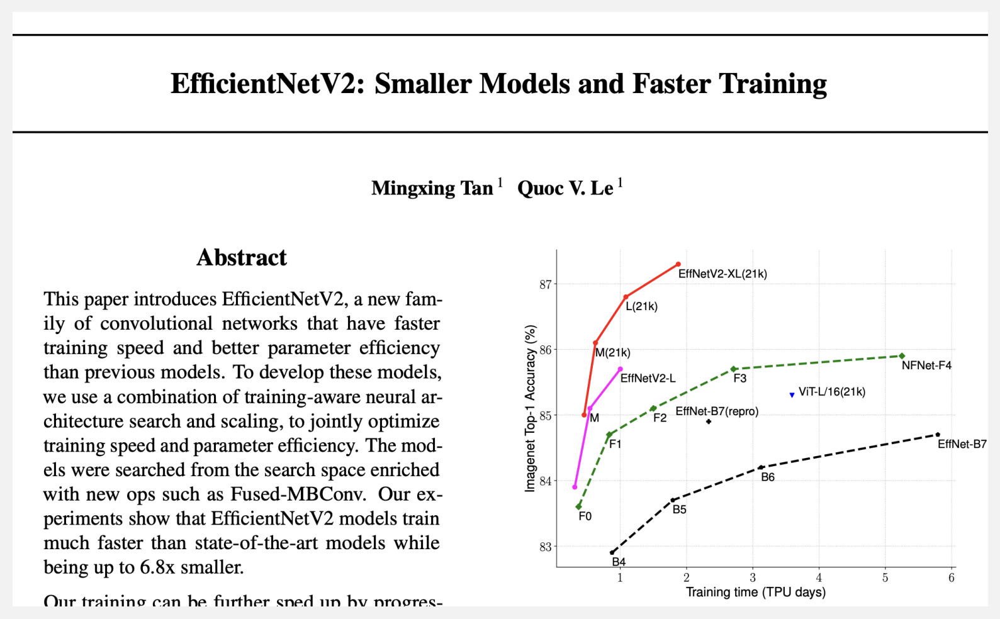

In [22]:
plt.figure(figsize=(10, 10)) 
plt.imshow(mpimg.imread('./ENv2_paper.png'))
plt.axis('off');

<sup><sub>*[Reference](https://doi.org/10.48550/arXiv.2104.00298)*</sup></sub>

Disable rescaling (0-1) because already included in the Keras loaded model.

ENv2B0 Reccomended image dim: 224 x 224

In [23]:
aug_gen = ImageDataGenerator(
                # rescale        = 1./255,      <------ disable rescaling
                rotation_range =10,
                shear_range    =0.2,
                horizontal_flip=True,
                vertical_flip  =True,
            )
data_gen = ImageDataGenerator()

#
train_aug = aug_gen.flow_from_directory(       # Notice that images are augmented ONLY in the TRAINING set
        TRAIN_PATH,
        target_size=DIM,
        color_mode='rgb',
        class_mode='categorical',
        shuffle=True,
        seed=SEED,
        batch_size=BATCH_SIZE
        )
val = data_gen.flow_from_directory(
        VAL_PATH,
        target_size=DIM,
        color_mode='rgb',
        shuffle=False,
        class_mode='categorical',
        batch_size=BATCH_SIZE
        )
test = data_gen.flow_from_directory(    # Hold-out set
        TEST_PATH,
        target_size=DIM,
        color_mode='rgb',
        shuffle=False,
        class_mode='categorical',
        batch_size=BATCH_SIZE
        )

Found 6834 images belonging to 5 classes.
Found 1364 images belonging to 5 classes.
Found 916 images belonging to 5 classes.


In [24]:
assert (test.class_indices == train_aug.class_indices) and (val.class_indices == train_aug.class_indices)
DIM_RGB = train_aug.image_shape
print('INPUT_DIM: ',train_aug.image_shape)
print('BATCH_SIZE: ', BATCH_SIZE)

INPUT_DIM:  (224, 224, 3)
BATCH_SIZE:  32


In [25]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications import  EfficientNetV2B0

# Load the EfficientNetV2B0 model pre-trained on the ImageNet dataset
ENv2 = EfficientNetV2B0(weights='imagenet',      # Use pre-trained weights from ImageNet
                        include_top=False,       # Exclude the top classifier layers of the model
                        input_shape=DIM_RGB,     # Specify the input shape of the model (224, 224, 3)
                        pooling='avg',           # Use global average poolingon top of he base model
                        )

### <a id='toc4_1_1_'></a>[Feature extraction](#toc0_)

In [26]:
# Freeze the layers of the pre-trained model
ENv2.trainable = False
# Define the input layer with the specified input shape
inputs = tf.keras.Input(shape=DIM_RGB, name='Input')
# Pass the inputs through the EfficientNetV2B0 model
x = ENv2(inputs, training=False) # training=False ensures batch normalization layers are in inference mode
# Add a Dropout layer to reduce overfitting
x = Dropout(0.5, seed=SEED, name='Dropout_1')(x)
# Add a Dense (fully connected) layer with 5 output units and softmax activation for classification
outputs = Dense(5, activation='softmax', name='Output')(x)
my_ENv2 = Model(inputs, outputs)

opt = tf.keras.optimizers.Adam(0.01)
my_ENv2.compile(optimizer=opt, loss='categorical_crossentropy', weighted_metrics=['accuracy'])
my_ENv2.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Function  (None, 1280)             5919312   
 al)                                                             
                                                                 
 Dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 Output (Dense)              (None, 5)                 6405      
                                                                 
Total params: 5,925,717
Trainable params: 6,405
Non-trainable params: 5,919,312
_________________________________________________________________


In [27]:
%%time
np.random.seed(SEED)
tf.random.set_seed(SEED)

history = my_ENv2.fit(train_aug, 
            epochs=5,             # set a low number of epochs because later we will fine-tune the model
            validation_data=val, 
            class_weight=cw, 
            #callbacks=my_callbacks
            )

Epoch 1/5
214/214 [==============================] - 44s 187ms/step - loss: 0.9577 - accuracy: 0.6357 - val_loss: 0.6980 - val_accuracy: 0.7185
Epoch 2/5
214/214 [==============================] - 37s 174ms/step - loss: 0.7991 - accuracy: 0.7018 - val_loss: 0.8949 - val_accuracy: 0.5748
Epoch 3/5
214/214 [==============================] - 38s 178ms/step - loss: 0.7632 - accuracy: 0.7151 - val_loss: 0.7223 - val_accuracy: 0.6804
Epoch 4/5
214/214 [==============================] - 39s 183ms/step - loss: 0.7424 - accuracy: 0.7186 - val_loss: 0.7952 - val_accuracy: 0.6613
Epoch 5/5
214/214 [==============================] - 39s 181ms/step - loss: 0.7496 - accuracy: 0.7417 - val_loss: 0.6808 - val_accuracy: 0.7258
CPU times: user 3min 34s, sys: 28.3 s, total: 4min 2s
Wall time: 3min 17s


43/43 [==============================] - 8s 116ms/step


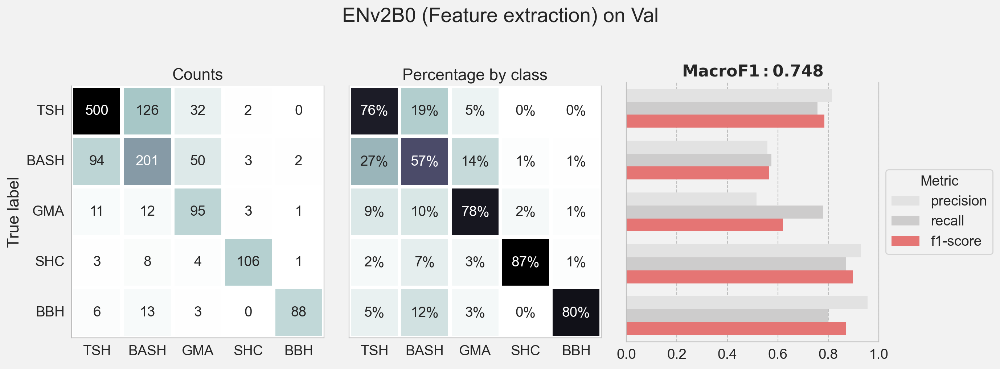

,precision,recall,f1-score
TSH,0.814332,0.757576,0.784929
BASH,0.558333,0.574286,0.566197
GMA,0.516304,0.778689,0.620915
SHC,0.929825,0.868852,0.898305
BBH,0.956522,0.800000,0.871287


In [28]:
TITLE = 'ENv2B0 (Feature extraction) on Val'
model = my_ENv2
data = val
y_preds = np.argmax(model.predict(data), axis=-1)
my_classification_report(data.classes, y_preds, TITLE)

***Comments***

---
- *There is an improvement in overall perfornaces, by only adopting ENv2 for Feature Extraction and training a simple top classifier for 5 epochs*
- *Let's try for a further improvement by fine-tuning*

---

### <a id='toc4_1_2_'></a>[Fine-tuning *(unfreeze last layers weights)*](#toc0_)

In [29]:
# Unfreeze the layers of the pre-trained model to allow for fine-tuning
ENv2.trainable = True
# Print the total number of layers in the EfficientNetV2B0 model
print("Number of layers in ENv2B0: ", len(ENv2.layers))
# Set the layer index from which to start fine-tuning
fine_tune_at = 240
# Freeze all the layers before the `fine_tune_at` layer to retain their pre-trained weights
for layer in ENv2.layers[:fine_tune_at]:
    layer.trainable = False

Number of layers in ENv2B0:  271


In [30]:
# decrease the initial learning rate
opt = tf.keras.optimizers.Adam(learning_rate = 1e-4)
my_ENv2.compile(optimizer=opt, loss = 'categorical_crossentropy', weighted_metrics = ['accuracy'])
my_ENv2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Function  (None, 1280)             5919312   
 al)                                                             
                                                                 
 Dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 Output (Dense)              (None, 5)                 6405      
                                                                 
Total params: 5,925,717
Trainable params: 1,170,277
Non-trainable params: 4,755,440
_________________________________________________________________


Epoch 1/500
214/214 [==============================] - 45s 193ms/step - loss: 0.5819 - accuracy: 0.7765 - val_loss: 0.5536 - val_accuracy: 0.7874 - lr: 1.0000e-04
Epoch 2/500
214/214 [==============================] - 39s 184ms/step - loss: 0.5179 - accuracy: 0.7928 - val_loss: 0.5395 - val_accuracy: 0.7947 - lr: 1.0000e-04
Epoch 3/500
214/214 [==============================] - 39s 183ms/step - loss: 0.5061 - accuracy: 0.7942 - val_loss: 0.5220 - val_accuracy: 0.8021 - lr: 1.0000e-04
Epoch 4/500
214/214 [==============================] - 40s 185ms/step - loss: 0.4718 - accuracy: 0.8055 - val_loss: 0.5433 - val_accuracy: 0.7823 - lr: 1.0000e-04
Epoch 5/500
214/214 [==============================] - 38s 178ms/step - loss: 0.4536 - accuracy: 0.8166 - val_loss: 0.5346 - val_accuracy: 0.7830 - lr: 1.0000e-04
Epoch 6/500
214/214 [==============================] - 38s 178ms/step - loss: 0.4381 - accuracy: 0.8207 - val_loss: 0.5205 - val_accuracy: 0.8028 - lr: 1.0000e-04
Epoch 7/500
214/214 [=

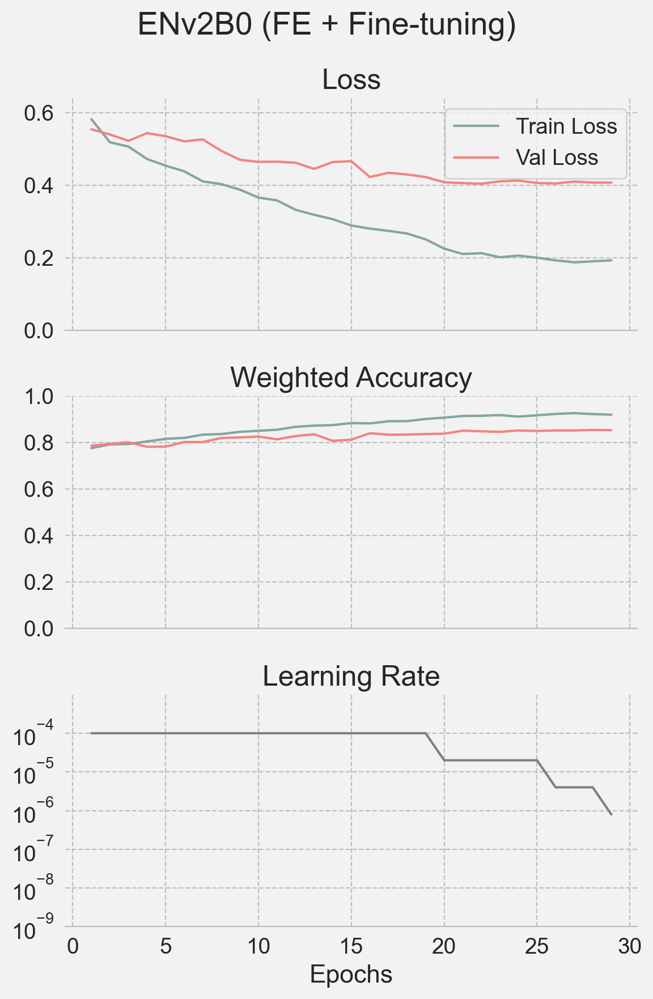

CPU times: user 21min 24s, sys: 2min 35s, total: 23min 59s
Wall time: 18min 19s


In [31]:
%%time
np.random.seed(SEED)
tf.random.set_seed(SEED)

history = my_ENv2.fit(train_aug,  
            epochs=500, 
            validation_data=val, 
            class_weight=cw, 
            callbacks=my_callbacks)
plot_training_history(history, title="ENv2B0 (FE + Fine-tuning)",SET_COL_DICT=SET_COL_DICT)

43/43 [==============================] - 7s 117ms/step


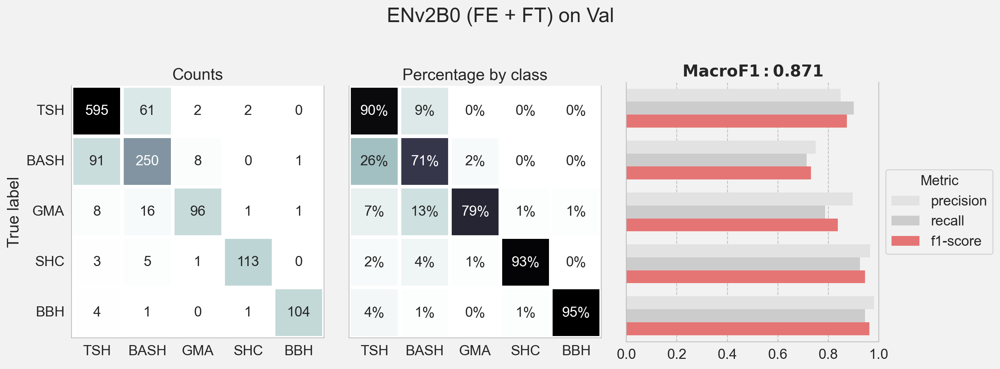

,precision,recall,f1-score
TSH,0.848787,0.901515,0.874357
BASH,0.750751,0.714286,0.732064
GMA,0.897196,0.786885,0.838428
SHC,0.965812,0.926230,0.945607
BBH,0.981132,0.945455,0.962963


In [32]:
TITLE = 'ENv2B0 (FE + FT) on Val'
model = my_ENv2
data = val
y_preds = np.argmax(model.predict(data), axis=-1)
my_classification_report(data.classes, y_preds, TITLE)

***Comments***

---
- *FE + Fine-tuning seems to work nice on EfficientNetV2B0 (Macro-F1: 0.871)*
- *By looking at metrics and confusion matrices it seems that the model does some misclassification between TSH, BASH and GMA, while SHC and BBH are classified better (despite being the less frequent classes)*

---

## <a id='toc4_2_'></a>[EfficientNetV2S (20M)](#toc0_)

Let's try a bigger model of the same family ( from 6M to 22M of parameters)

Reccomended input dim: 300 x 300

In [33]:
DIM = (300,300)                                # New input dimensions (reccomended for EfficientNetV2S)

#
train_aug = aug_gen.flow_from_directory(       # Notice that images are augmented ONLY in the TRAINING set
        TRAIN_PATH,
        target_size=DIM,
        color_mode='rgb',
        class_mode='categorical',
        shuffle=True,
        seed=SEED,
        batch_size=BATCH_SIZE
        )
val = data_gen.flow_from_directory(
        VAL_PATH,
        target_size=DIM,
        color_mode='rgb',
        shuffle=False,
        class_mode='categorical',
        batch_size=BATCH_SIZE
        )
test = data_gen.flow_from_directory(    # Hold-out set
        TEST_PATH,
        target_size=DIM,
        color_mode='rgb',
        shuffle=False,
        class_mode='categorical',
        batch_size=BATCH_SIZE
        )

Found 6834 images belonging to 5 classes.
Found 1364 images belonging to 5 classes.
Found 916 images belonging to 5 classes.


In [34]:
assert (test.class_indices == train_aug.class_indices) and (val.class_indices == train_aug.class_indices)
DIM_RGB = train_aug.image_shape
print('INPUT_DIM: ',train_aug.image_shape)

INPUT_DIM:  (300, 300, 3)


In [35]:
from tensorflow.keras.applications import  EfficientNetV2S

ENv2_S = EfficientNetV2S(weights='imagenet', 
                        include_top=False, 
                        input_shape=DIM_RGB, 
                        pooling='avg',
                        )

### <a id='toc4_2_1_'></a>[Feature extraction](#toc0_)

In [36]:
# Freeze the layers of the pre-trained model
ENv2_S.trainable = False
# 
inputs = tf.keras.Input(shape=DIM_RGB, name='Input')
x = ENv2_S(inputs, training=False)                             # training=False to keep the batch norm layers in inference mode
x = Dropout(0.5, seed=SEED, name='Dropout_1')          (x)
outputs = Dense(5, activation='softmax', name='Output')(x)

# Create the final model
my_ENv2_S = Model(inputs, outputs)
opt = tf.keras.optimizers.Adam(0.01)
my_ENv2_S.compile(optimizer=opt, loss = 'categorical_crossentropy', weighted_metrics=['accuracy'])
my_ENv2_S.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 300, 300, 3)]     0         
                                                                 
 efficientnetv2-s (Functiona  (None, 1280)             20331360  
 l)                                                              
                                                                 
 Dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 Output (Dense)              (None, 5)                 6405      
                                                                 
Total params: 20,337,765
Trainable params: 6,405
Non-trainable params: 20,331,360
_________________________________________________________________


In [37]:
%%time
np.random.seed(SEED)
tf.random.set_seed(SEED)

history = my_ENv2_S.fit(train_aug, 
            epochs=5, 
            validation_data=val, 
            class_weight=cw, 
            #callbacks=my_callbacks
            )

Epoch 1/5
214/214 [==============================] - 92s 394ms/step - loss: 0.9484 - accuracy: 0.6315 - val_loss: 0.7937 - val_accuracy: 0.6562
Epoch 2/5
214/214 [==============================] - 72s 335ms/step - loss: 0.8040 - accuracy: 0.6962 - val_loss: 0.8765 - val_accuracy: 0.6320
Epoch 3/5
214/214 [==============================] - 72s 336ms/step - loss: 0.7874 - accuracy: 0.7090 - val_loss: 0.7088 - val_accuracy: 0.7104
Epoch 4/5
214/214 [==============================] - 71s 333ms/step - loss: 0.7911 - accuracy: 0.7122 - val_loss: 0.8014 - val_accuracy: 0.6708
Epoch 5/5
214/214 [==============================] - 71s 333ms/step - loss: 0.7801 - accuracy: 0.7163 - val_loss: 0.7411 - val_accuracy: 0.7126
CPU times: user 6min 21s, sys: 48.1 s, total: 7min 9s
Wall time: 6min 19s


43/43 [==============================] - 24s 421ms/step


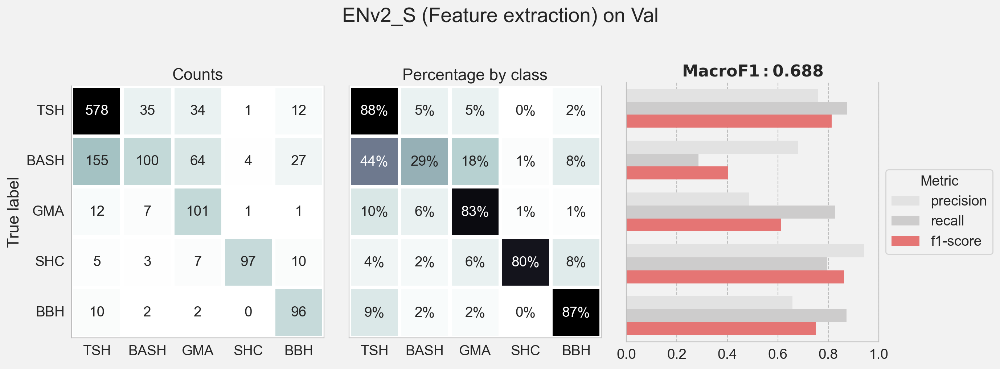

,precision,recall,f1-score
TSH,0.760526,0.875758,0.814085
BASH,0.680272,0.285714,0.402414
GMA,0.485577,0.827869,0.612121
SHC,0.941748,0.795082,0.862222
BBH,0.657534,0.872727,0.750000


In [38]:
TITLE = 'ENv2_S (Feature extraction) on Val'
model = my_ENv2_S
data = val
y_preds = np.argmax(model.predict(data), axis=-1)
my_classification_report(data.classes, y_preds, TITLE)

### <a id='toc4_2_2_'></a>[Fine-tuning *(unfreeze last layers weights)*](#toc0_)

In [39]:
ENv2_S.trainable = True
# Let's take a look to see how many layers are in the base model
print("Number of layers in EfficientNetV2S: ", len(ENv2_S.layers))
# Fine-tune from this layer onwards
fine_tune_at = 400
# Freeze all the layers before the `fine_tune_at` layer
for layer in ENv2_S.layers[:fine_tune_at]:
    layer.trainable = False

Number of layers in EfficientNetV2S:  514


In [40]:
# decrease the learning rate
opt = tf.keras.optimizers.Adam(learning_rate = 1e-4)
my_ENv2_S.compile(optimizer=opt, loss = 'categorical_crossentropy', weighted_metrics = ['accuracy'])
my_ENv2_S.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input (InputLayer)          [(None, 300, 300, 3)]     0         
                                                                 
 efficientnetv2-s (Functiona  (None, 1280)             20331360  
 l)                                                              
                                                                 
 Dropout_1 (Dropout)         (None, 1280)              0         
                                                                 
 Output (Dense)              (None, 5)                 6405      
                                                                 
Total params: 20,337,765
Trainable params: 7,766,213
Non-trainable params: 12,571,552
_________________________________________________________________


Epoch 1/500
214/214 [==============================] - 127s 521ms/step - loss: 0.6518 - accuracy: 0.7499 - val_loss: 0.5965 - val_accuracy: 0.7617 - lr: 1.0000e-04
Epoch 2/500
214/214 [==============================] - 93s 430ms/step - loss: 0.5096 - accuracy: 0.7977 - val_loss: 0.5693 - val_accuracy: 0.7801 - lr: 1.0000e-04
Epoch 3/500
214/214 [==============================] - 93s 434ms/step - loss: 0.4401 - accuracy: 0.8243 - val_loss: 0.5652 - val_accuracy: 0.7801 - lr: 1.0000e-04
Epoch 4/500
214/214 [==============================] - 93s 432ms/step - loss: 0.3603 - accuracy: 0.8503 - val_loss: 0.5636 - val_accuracy: 0.7727 - lr: 1.0000e-04
Epoch 5/500
214/214 [==============================] - 92s 431ms/step - loss: 0.3416 - accuracy: 0.8625 - val_loss: 0.4959 - val_accuracy: 0.8152 - lr: 1.0000e-04
Epoch 6/500
214/214 [==============================] - 93s 434ms/step - loss: 0.2722 - accuracy: 0.8915 - val_loss: 0.4758 - val_accuracy: 0.8277 - lr: 1.0000e-04
Epoch 7/500
214/214 [

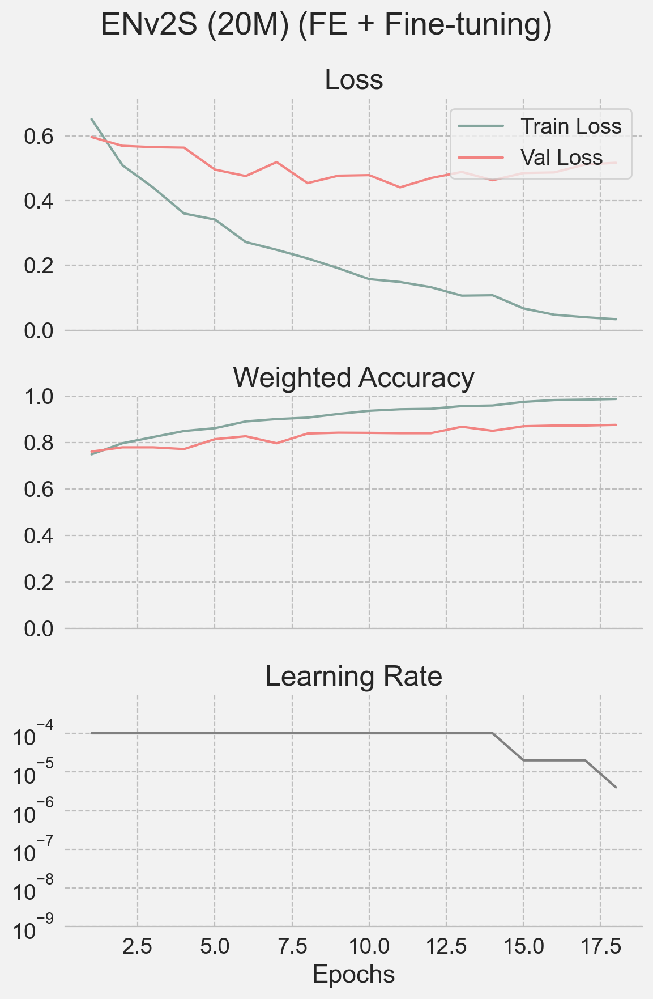

CPU times: user 25min 1s, sys: 4min 4s, total: 29min 6s
Wall time: 28min 29s


In [41]:
%%time
np.random.seed(SEED)
tf.random.set_seed(SEED)

history = my_ENv2_S.fit(train_aug,  
            epochs=500, 
            validation_data=val, 
            class_weight=cw, 
            callbacks=my_callbacks)
plot_training_history(history, title="ENv2S (20M) (FE + Fine-tuning)",SET_COL_DICT=SET_COL_DICT)

43/43 [==============================] - 33s 506ms/step


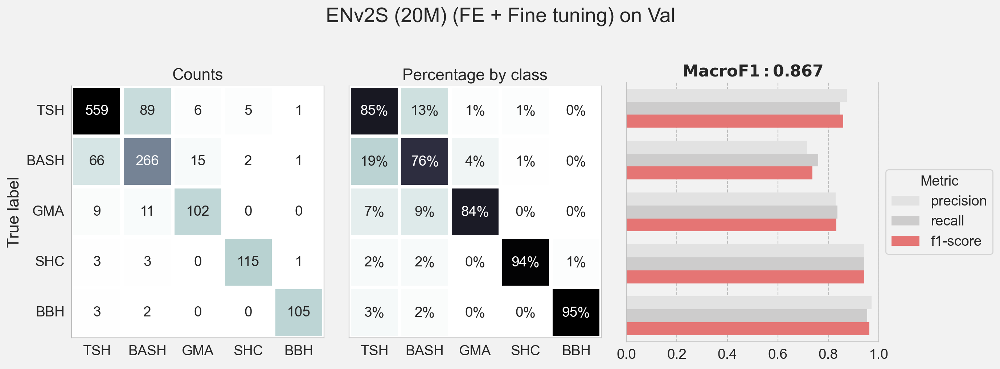

,precision,recall,f1-score
TSH,0.873437,0.846970,0.860000
BASH,0.716981,0.760000,0.737864
GMA,0.829268,0.836066,0.832653
SHC,0.942623,0.942623,0.942623
BBH,0.972222,0.954545,0.963303


In [42]:
TITLE = 'ENv2S (20M) (FE + Fine tuning) on Val'
model = my_ENv2_S
data = val
y_preds = np.argmax(model.predict(data), axis=-1)
my_classification_report(data.classes, y_preds, TITLE)

***Comments***

---
- *The bigger EfficientNetV2S seems to perform similarly to the smaller EfficientNetV2B0 (Macro-F1: 0.867 vs 0.871) (20M vs 6M of parameters)*
- *Also, there are still more misclassifications between TSH, BASH and GMA, compared to SHC and BBH*
- *Since the EfficientNetV2B0 has ~3.5x less parameters I will consider it as the **best model***

---

# <a id='toc5_'></a>[Evaluate the best model on Test set (Hold-out)](#toc0_)

In [45]:
test = data_gen.flow_from_directory(    # Hold-out set
        TEST_PATH,
        target_size=(224,224),          # <-- model input dimensions
        color_mode='rgb',
        shuffle=False,
        class_mode='categorical',
        batch_size=BATCH_SIZE
        )

Found 916 images belonging to 5 classes.


29/29 [==============================] - 14s 261ms/step


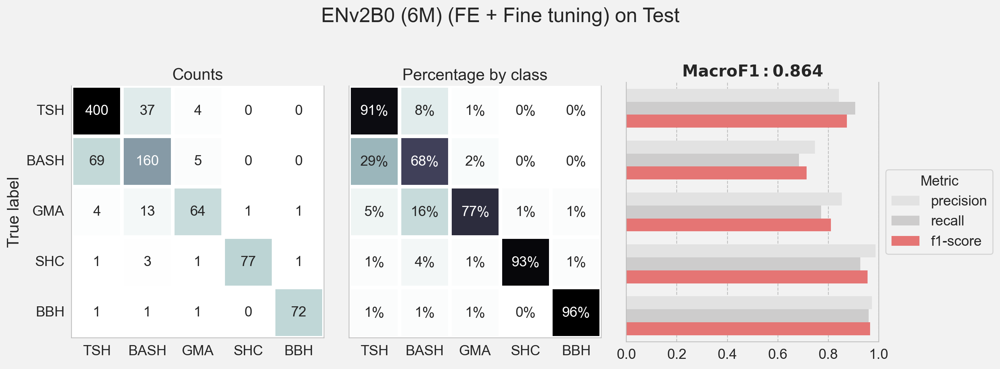

,precision,recall,f1-score
TSH,0.842105,0.907029,0.873362
BASH,0.747664,0.683761,0.714286
GMA,0.853333,0.771084,0.810127
SHC,0.987179,0.927711,0.956522
BBH,0.972973,0.960000,0.966443


In [46]:
TITLE = 'ENv2B0 (6M) (FE + Fine tuning) on Test'
model = my_ENv2
data = test
y_preds = np.argmax(model.predict(data), axis=-1)
my_classification_report(data.classes, y_preds, TITLE)

***Comments***

---
- When evaluated on the test set (Hold-out), EfficientNetV2B0 performs very similarly to the validation set, indicating that the model generalizes well to unseen data. This consistency between validation and test performance suggests robustness and reliability of the model.

---

***Possible Improvements***

---

- ***Test Other Model Families:*** Test different architectures, such as ResNet, DenseNet, etc., to determine if they offer superior performance or complementary strengths compared to EfficientNetV2S.
- ***Cross-Validation:*** Implement cross-validation techniques to ensure that the model's performance is consistent across different subsets of the data. 
- ***Automatic Hyperparameters Tuning:*** Utilize automated hyperparameter optimization techniques, such as Bayesian optimization or grid search, to fine-tune the model's hyperparameters. This can help in finding the optimal settings for better performance and efficiency.

---

*Mario Esposito 17/06/2024*

---
